In [1]:
library(tidyverse)
theme_set(theme_classic())
options(repr.plot.width  = 10, repr.plot.height = 10, repr.plot.res = 150)
options(jupyter.rich_display=T)
set.seed(1)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.2     ✔ tibble    3.3.0
✔ lubridate 1.9.4     ✔ tidyr     1.3.1
✔ purrr     1.1.0     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors


# STATS 504
## Week 12: Spatial data analysis

### The `sf` package
To analyze spatial data in R, we will use the [`sf` package](https://r-spatial.github.io/sf/).

In [2]:
library(sf)

Linking to GEOS 3.13.0, GDAL 3.8.5, PROJ 9.5.1; sf_use_s2() is TRUE



In [3]:
 #system("apt-get -y update")
 #system("apt-get install -y libudunits2-dev libgdal-dev libgeos-dev libproj-dev gdal-bin")
 #install.packages(c("sf", "ggspatial", "prettymapr", "tidygeocoder", "tidycensus"))

Warning message in system("apt-get -y update"):
“error in running command”
Warning message in system("apt-get install -y libudunits2-dev libgdal-dev libgeos-dev libproj-dev gdal-bin"):
“error in running command”
also installing the dependencies ‘rosm’, ‘rjson’, ‘tigris’





The downloaded binary packages are in
	/var/folders/ng/qcb7p5f14nl6kwpxnh6rz73h0000gn/T//RtmpZBch1g/downloaded_packages


## Snow on Cholera

![snow map](https://upload.wikimedia.org/wikipedia/commons/thumb/2/27/Snow-cholera-map-1.jpg/639px-Snow-cholera-map-1.jpg)

### Utility of mapping and spatial analysis

- Mapping cholera deaths and water pump locations directly illustrated the epidemic's root cause.
- Visual correlation between disease outbreaks and environmental factors reveals underlying patterns missed by other analyses.



### Shapefiles

- A shapefile is a popular spatial data format, originally for ArcView by Esri, now open-spec.
- Used to store geometric data like points, lines, polygons for mapping geographic areas.
- Consists of several files (.shp, .shx, .dbf) that work together to represent spatial data.

In [4]:
download.file("http://rtwilson.com/downloads/SnowGIS_SHP.zip", "SnowGIS_SHP.zip")
unzip('SnowGIS_SHP.zip')

In [5]:
dsn <- fs::path(".", "SnowGIS_SHP")
list.files(dsn)

[1] "Cholera_Deaths.dbf"          "Cholera_Deaths.prj"         
 [3] "Cholera_Deaths.sbn"          "Cholera_Deaths.sbx"         
 [5] "Cholera_Deaths.shp"          "Cholera_Deaths.shx"         
 [7] "OSMap_Grayscale.tfw"         "OSMap_Grayscale.tif"        
 [9] "OSMap_Grayscale.tif.aux.xml" "OSMap_Grayscale.tif.ovr"    
[11] "OSMap.tfw"                   "OSMap.tif"                  
[13] "Pumps.dbf"                   "Pumps.prj"                  
[15] "Pumps.sbx"                   "Pumps.shp"                  
[17] "Pumps.shx"                   "README.txt"                 
[19] "SnowMap.tfw"                 "SnowMap.tif"                
[21] "SnowMap.tif.aux.xml"         "SnowMap.tif.ovr"

- Note that there are six files with the name `Cholera_Deaths` and another five with the name `Pumps`. 
- These correspond to two different sets of shapefiles called *layers*.

In [8]:
dsn
#st_layers(dsn)

./SnowGIS_SHP

### Loading shapfiles into R

- `st_read()` to load the shapefiles as R data.
- The data is both a data.frame and an sf object.
- Files include a specific geographic projection (CRS) to be discussed further.


In [9]:
Cholera_Deaths <- st_read(dsn, layer="Cholera_Deaths")

Reading layer `Cholera_Deaths' from data source 
  `/Users/keanmingtan/Dropbox/Teaching/Umich2019/Fall2025/STATS504/lecturenotes/week12/SnowGIS_SHP' 
  using driver `ESRI Shapefile'
Simple feature collection with 250 features and 2 fields
Geometry type: POINT
Dimension:     XY
Bounding box:  xmin: 529160.3 ymin: 180857.9 xmax: 529655.9 ymax: 181306.2
Projected CRS: OSGB36 / British National Grid


In [12]:
#install.packages("geojsonio")
Cholera_Deaths$geometry

also installing the dependencies ‘triebeard’, ‘urltools’, ‘httpcode’, ‘protolite’, ‘geometries’, ‘jsonify’, ‘rapidjsonr’, ‘sfheaders’, ‘crul’, ‘geojson’, ‘geojsonsf’, ‘jqr’, ‘sp’





The downloaded binary packages are in
	/var/folders/ng/qcb7p5f14nl6kwpxnh6rz73h0000gn/T//RtmpZBch1g/downloaded_packages


POINT (529308.7 181031.4)

POINT (529312.2 181025.2)

POINT (529314.4 181020.3)

POINT (529317.4 181014.3)

POINT (529320.7 181007.9)

Registered S3 method overwritten by 'geojsonsf':
  method        from   
  print.geojson geojson



Geometry set for 250 features 
Geometry type: POINT
Dimension:     XY
Bounding box:  xmin: 529160.3 ymin: 180857.9 xmax: 529655.9 ymax: 181306.2
Projected CRS: OSGB36 / British National Grid
First 5 geometries:

This is new type of data frame that we haven't seen before. It contains a special column, "geometry", that represents spatial data.

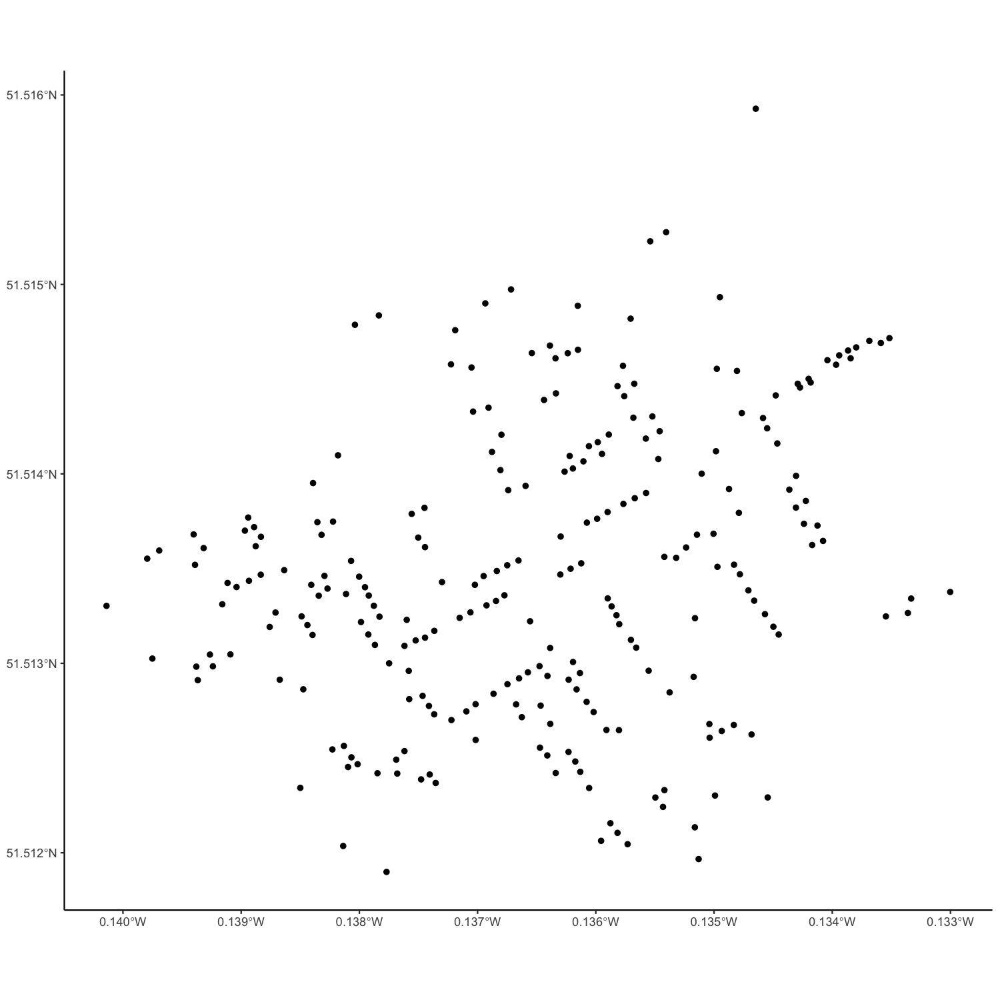

In [13]:
# plot cholera deaths
Cholera_Deaths %>% ggplot + geom_sf()

![snow map](https://upload.wikimedia.org/wikipedia/commons/thumb/2/27/Snow-cholera-map-1.jpg/639px-Snow-cholera-map-1.jpg)

## Making maps
- `sf` integrates with `ggplot2` through the `geom_sf()` function.
- Adds support for plotting spatial objects to ggplot2.

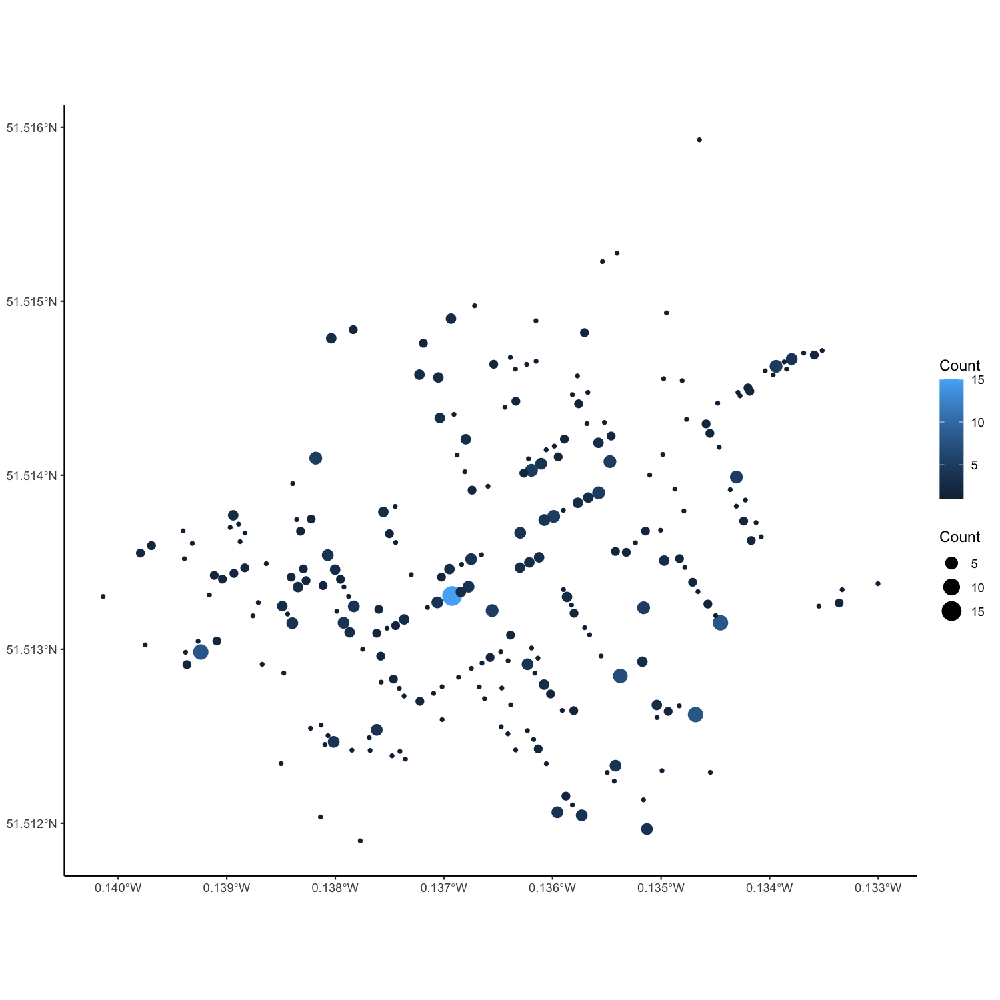

In [14]:
ggplot(Cholera_Deaths) + geom_sf(aes(size = Count, color = Count))

- This improves on the basic `plot()` call. 
- We get lat/lon coordinates for example. 
- But what we really want to do is plot these points on a map.

also installing the dependency ‘terra’





The downloaded binary packages are in
	/var/folders/ng/qcb7p5f14nl6kwpxnh6rz73h0000gn/T//RtmpZBch1g/downloaded_packages


Loading required namespace: raster

Zoom: 18

Fetching 42 missing tiles

...complete!

Warning message in geom2trace.default(dots[[1L]][[1L]], dots[[2L]][[1L]], dots[[3L]][[1L]]):
“geom_GeomMapTile() has yet to be implemented in plotly.
  If you'd like to see this geom implemented,
  Please open an issue with your example code at
  https://github.com/ropensci/plotly/issues”


  |======================================================================| 100%

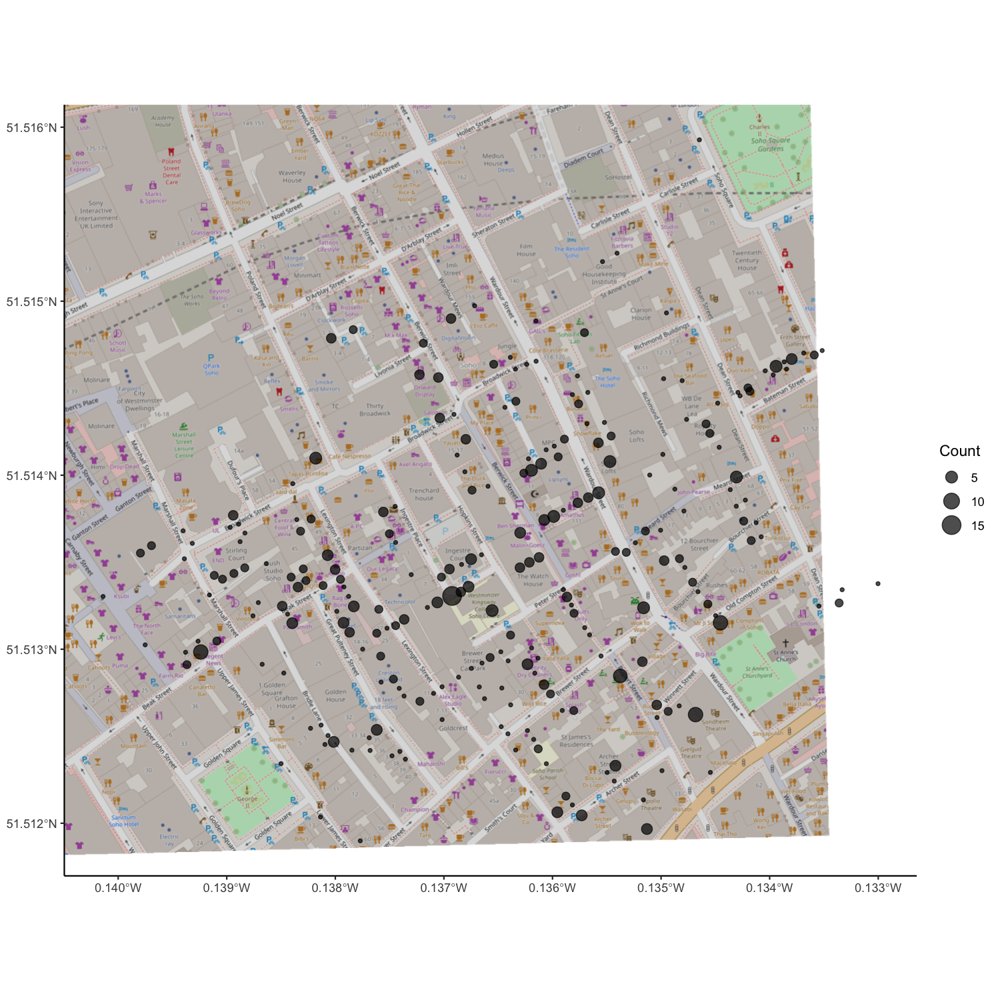

In [16]:
library(ggspatial)
#install.packages("raster")
ggplot(Cholera_Deaths) +
    annotation_map_tile(zoom = 18) + 
    geom_sf(aes(size = Count), alpha = 0.7)

### Sanity check
https://www.google.com/maps/place/The+John+Snow,+39+Broadwick+St,+Carnaby,+London+W1F+9QJ,+UK/data=!4m2!3m1!1s0x487604d4ecaf626b:0xf25497cc7687c11f?sa=X&ved=1t:242&ictx=111

In [17]:
coords <- c(51.5132948, -0.13662)

# Create a data frame with the coordinates
john_snow_pub <- data.frame(
  name = "The John Snow Pub",
  long = coords[2],
  lat = coords[1]
)


john_snow_pub_sf <- st_as_sf(john_snow_pub, coords = c("long", "lat"), crs = 4326)
john_snow_pub_sf

,name,geometry
,<chr>,<POINT [°]>
1,The John Snow Pub,POINT (-0.13662 51.51329)


Zoom: 18



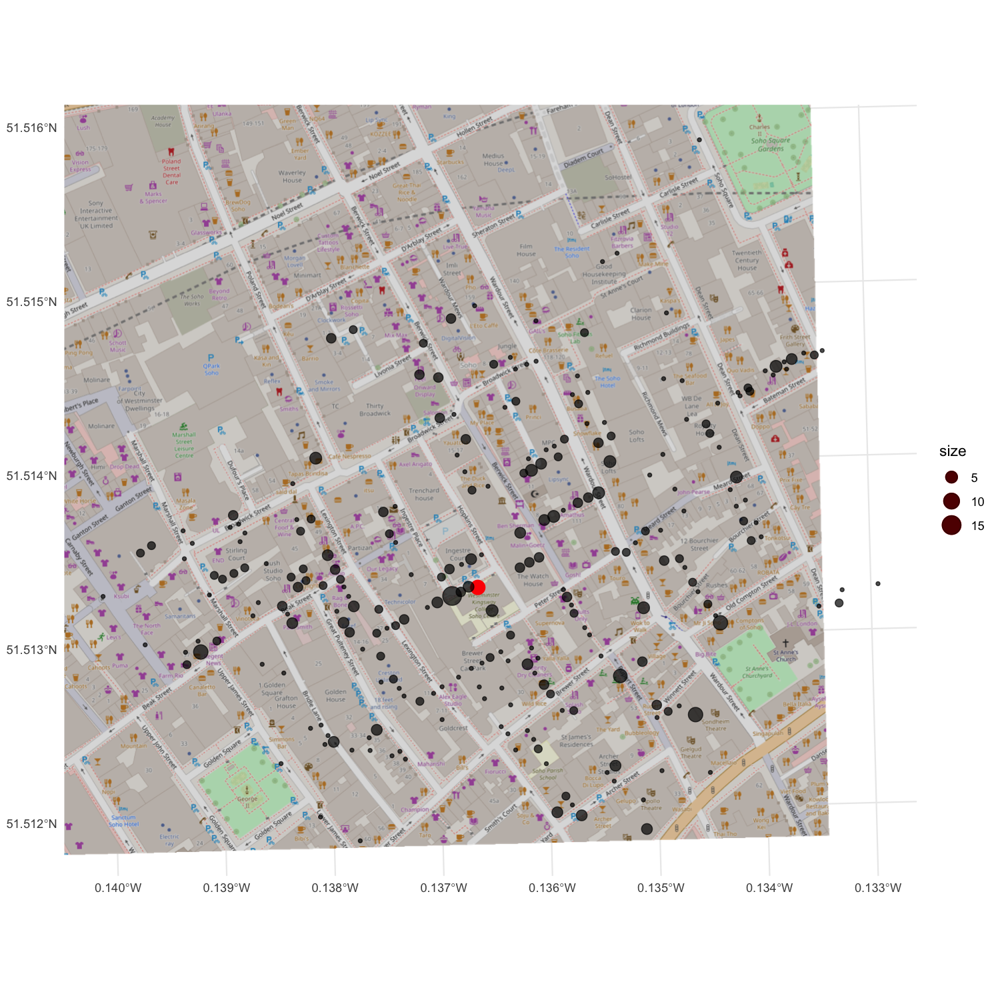

In [18]:
ggplot(Cholera_Deaths) + 
  annotation_map_tile(type = "osm", zoom = 18) +
  geom_sf(data = john_snow_pub_sf, aes(size = 8), color = "red") + # Plot the pub location
  geom_sf(aes(size = Count), alpha = 0.7) +
  theme_minimal() 

In [19]:
st_bbox(Cholera_Deaths)

    xmin     ymin     xmax     ymax 
529160.3 180857.9 529655.9 181306.2 

## Projections
- The earth is a sphere(oid), requiring transformation to 2D for maps and screens.
- No single projection can perfectly represent 3D Earth in 2D.
- An ideal, completely accurate projection system doesn't exist.
- Trade-offs:
  - Shape/Angle Preservation: Some projections maintain accurate angles, useful for navigation (e.g., Mercator Projection).
  - Area Preservation: Other projections maintain the relative sizes of areas but can't preserve both area and shape/angle simultaneously.
- Mercator Projection: Popular for its angle-preserving quality but criticized for distorting sizes near the poles.


Loading required package: maps


Attaching package: ‘maps’


The following object is masked from ‘package:purrr’:

    map


Warning message in map("world", projection = "mercator", wrap = TRUE):
“projection failed for some data”


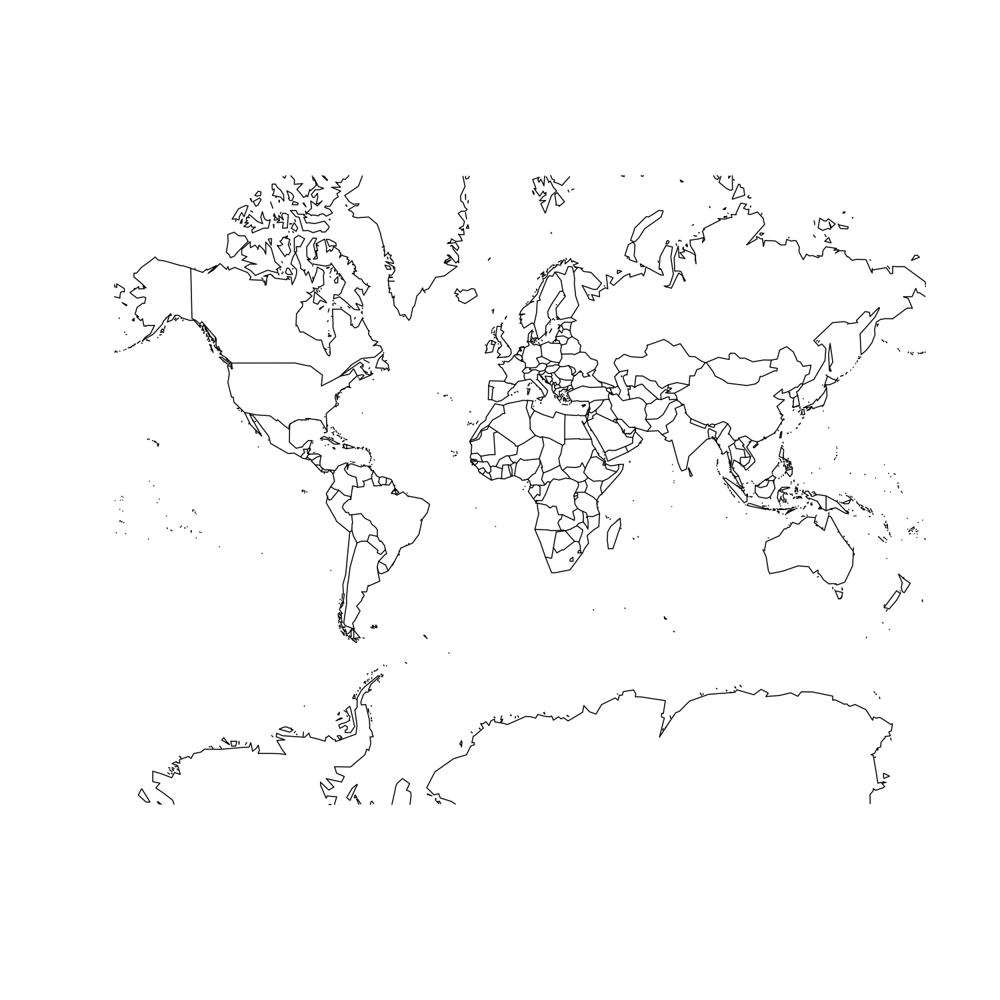

In [20]:
library(mapproj)
library(maps)

map("world", projection = "mercator", wrap = TRUE)

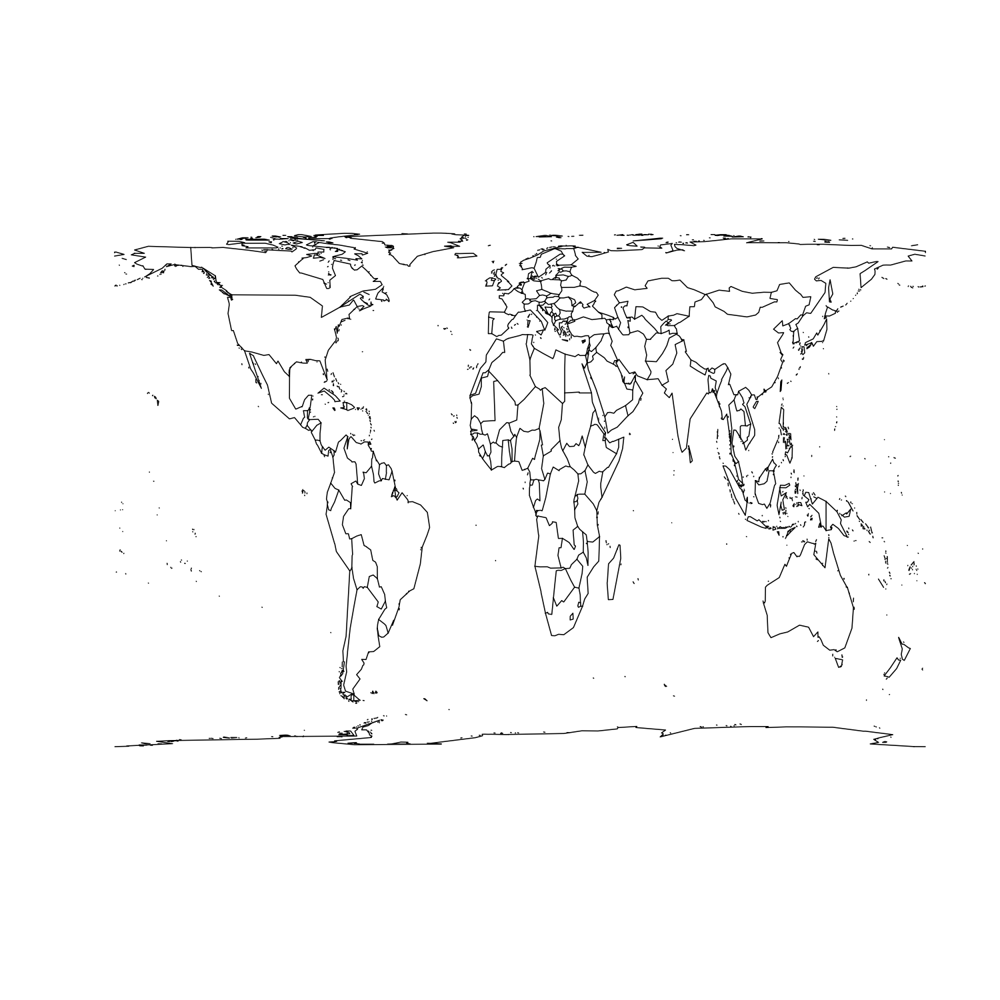

In [21]:
map("world", projection = "cylequalarea", param = 45, wrap = TRUE)

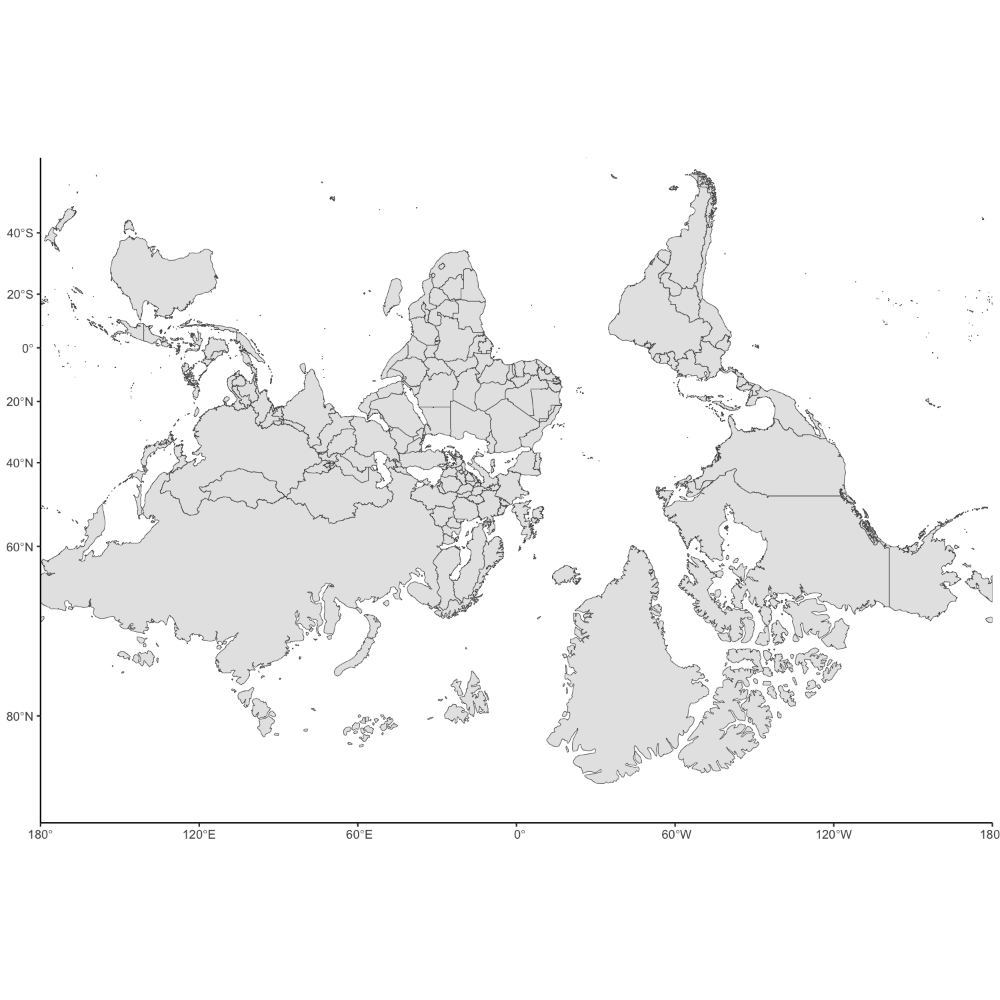

In [27]:
library(rnaturalearth)

# Load world map
world <- ne_countries(scale = "medium", returnclass = "sf")

# Plot with ggplot2
ggplot(data = world) +
  geom_sf() +
  coord_sf(expand=F, ylim=c(-20000000,8000000), 
           crs = paste0('+proj=merc +lat_0=0 +lon_0=0 +k=1 +x_0=0 +y_0=0 ',
                         '+axis=wsu +ellps=WGS84 +towgs84=0,0,0,0,0,0,0 ',
                         '+units=m +no_defs'))


Zoom: 18



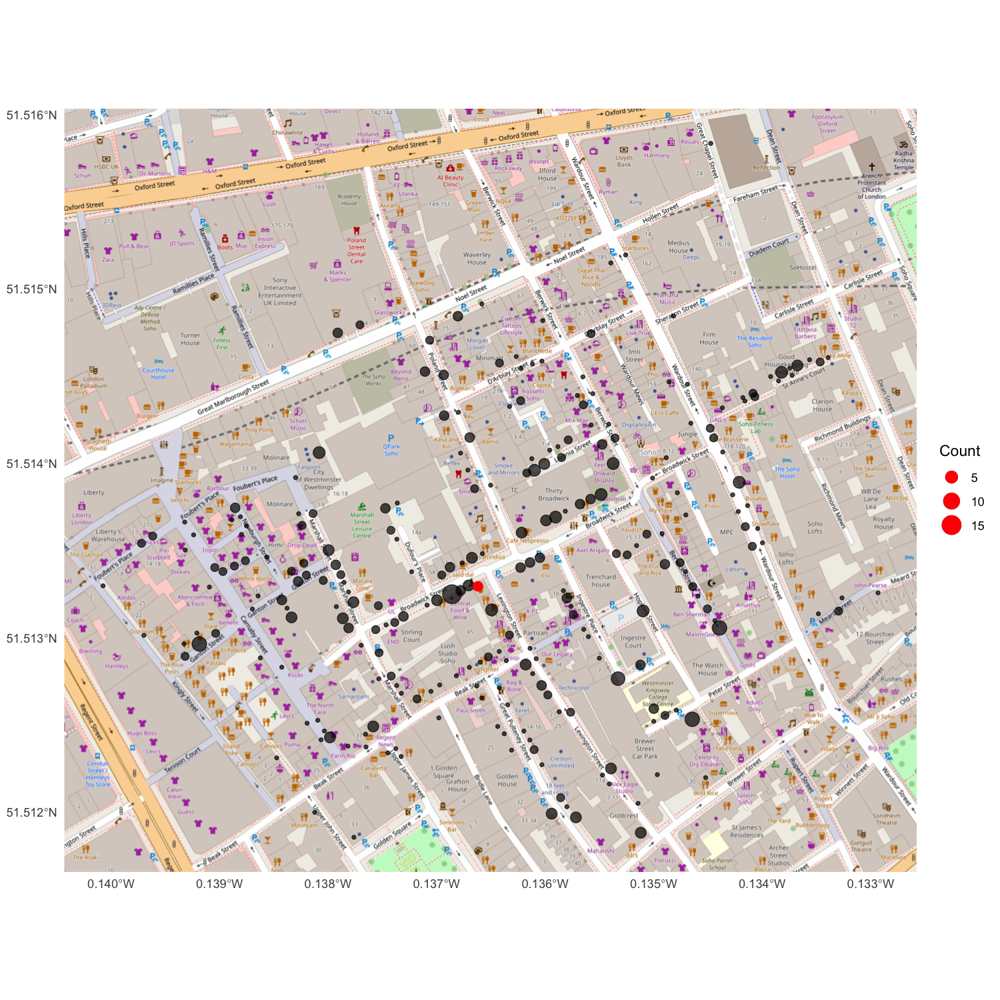

In [28]:
cholera_4326 <- Cholera_Deaths %>% 
  st_transform(4326)

ggplot(cholera_4326) + 
  annotation_map_tile(type = "osm", zoomin = 1) + 
  geom_sf(aes(size = Count), alpha = 0.7) +
  geom_sf(data = john_snow_pub_sf, aes(size = 3), color = "red") + # Plot the pub location
  theme_minimal()



In [37]:
st_crs(Cholera_Deaths)$proj4string

[1] "+proj=tmerc +lat_0=49 +lon_0=-2 +k=0.9996012717 +x_0=400000 +y_0=-100000 +ellps=airy +units=m +no_defs"

- The `Cholera_Deaths` object matches `epsg:27700` specifications except for missing `+datum` and `+towgs84` tags.
- Documentation advises using [`epsg:27700`](https://epsg.io/27700) for the `CholeraDeaths` data.
- So, to successfully project:
  1. Confirm `CholeraDeaths` data is in `epsg:27700`.
  2. Successfully project to `epsg:4326` for accurate geospatial representation.


In [38]:
cholera_latlong <- Cholera_Deaths %>%
  st_set_crs(27700) %>%
  st_transform(4326)

Zoom: 18



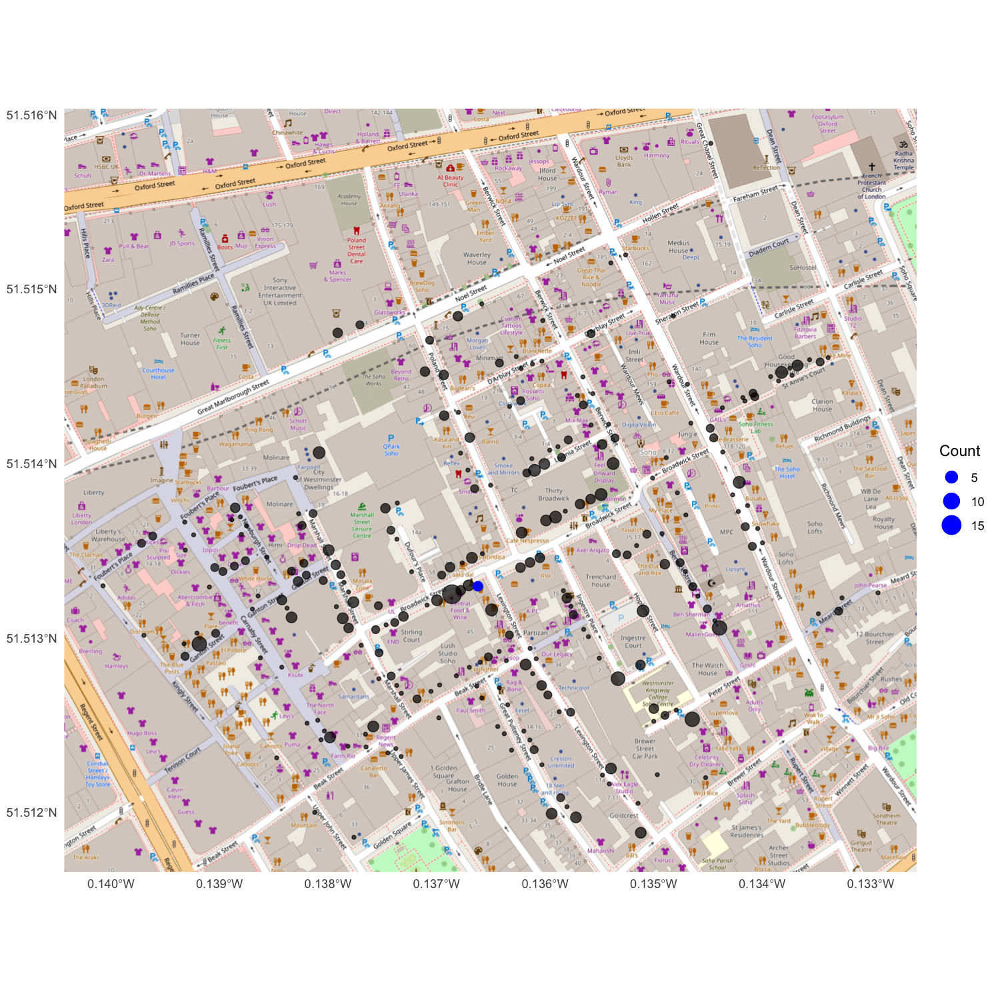

In [39]:
(snow <- 
  ggplot(cholera_latlong) + 
  annotation_map_tile(type = "osm", zoom = 18) + 
  geom_sf(aes(size = Count), alpha = 0.7) +
  geom_sf(data = john_snow_pub_sf, aes(size = 3), color = "blue") + # Plot the pub location
  theme_minimal())

Reading layer `Pumps' from data source 
  `/Users/keanmingtan/Dropbox/Teaching/Umich2019/Fall2025/STATS504/lecturenotes/week12/SnowGIS_SHP' 
  using driver `ESRI Shapefile'
Simple feature collection with 8 features and 1 field
Geometry type: POINT
Dimension:     XY
Bounding box:  xmin: 529183.7 ymin: 180660.5 xmax: 529748.9 ymax: 181193.7
Projected CRS: OSGB36 / British National Grid


Zoom: 18

Fetching 22 missing tiles

...complete!



  |======================================================================| 100%

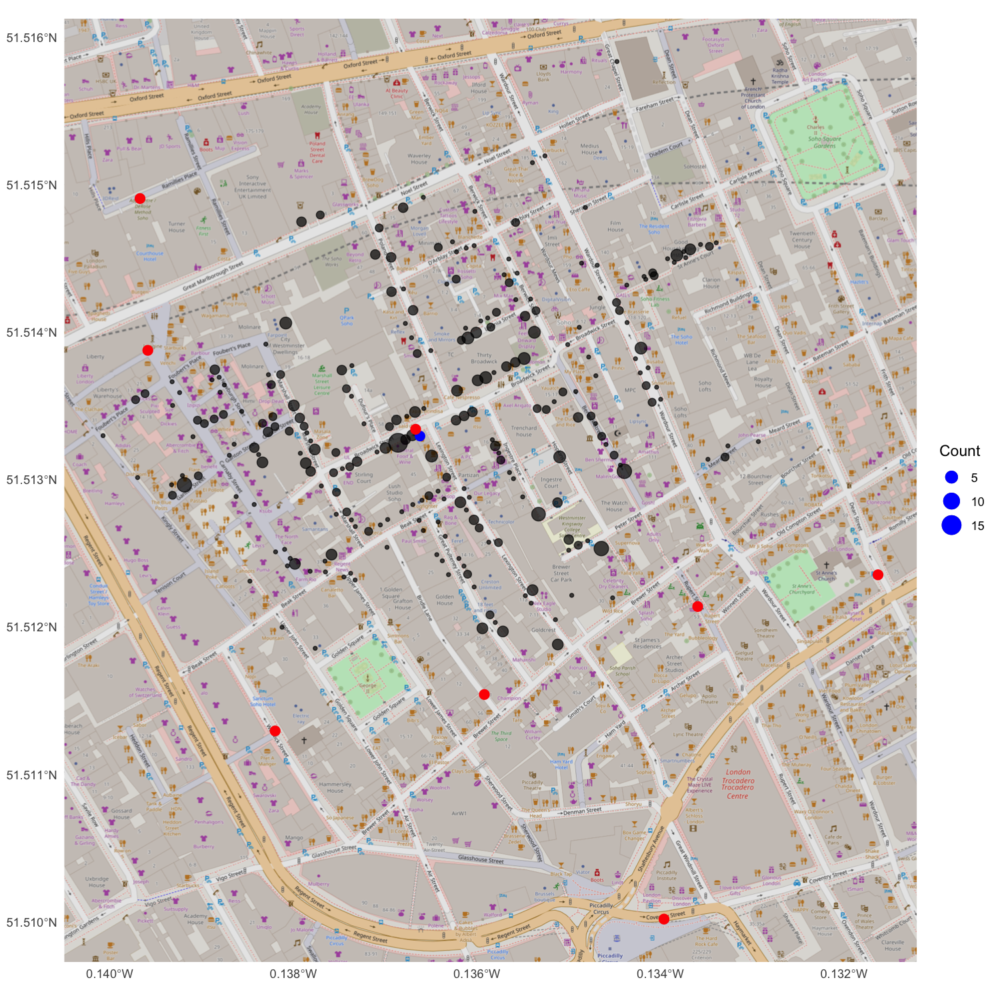

In [41]:
 pumps <- st_read(dsn, layer = "Pumps")
 pumps_latlong <- pumps %>% 
   st_set_crs(27700) %>%
   st_transform(4326)
snow +
  geom_sf(data = pumps_latlong, size = 3, color = "red")

## Flint water crisis

In [43]:
load("flint.Rdata")
flint %>% print

# A tibble: 23,184 × 11
   `Sample Number` `Date Submitted`    `Analysis (Lead)` `Lead (ppb)`
   <chr>           <dttm>              <chr>                    <dbl>
 1 LF84899         2015-09-25 11:07:30 Lead                         0
 2 LF85330         2015-09-29 14:35:09 Lead                         0
 3 LF85604         2015-09-30 13:06:52 Lead                         0
 4 LF85613         2015-09-30 13:07:02 Lead                         0
 5 LF85796         2015-10-01 11:10:35 Lead                         0
 6 LF85797         2015-10-01 11:10:36 Lead                         0
 7 LF85799         2015-10-01 11:10:38 Lead                         0
 8 LF85802         2015-10-01 11:10:41 Lead                         0
 9 LF85862         2015-10-01 12:46:38 Lead                         0
10 LF85931         2015-10-02 09:54:53 Lead                         0
# ℹ 23,174 more rows
# ℹ 7 more variables: `Analysis (Copper)` <chr>, `Copper (ppb)` <dbl>,
#   `Street #` <chr>, `Street Name` <chr>, C

EPA standards for lead ([source](https://www.atsdr.cdc.gov/csem/leadtoxicity/safety_standards.html#:~:text=Action%20levels%20for%20lead%20of,biomedical%20considerations%2C%20independent%20of%20feasibility.)):

> The EPA Lead and Copper Rule has set drinking water standards with two levels of protection [EPA 1991; EPA 2000b].
>  - Action levels for lead of 15 ppb and copper of 1.3 ppm in more than 10% of customer taps sampled. An action level is the level for enforcement.
>  - The maximum contaminant level goal (MCLG) is zero. This is the level determined to be safe according to toxicological and biomedical considerations, independent of feasibility.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


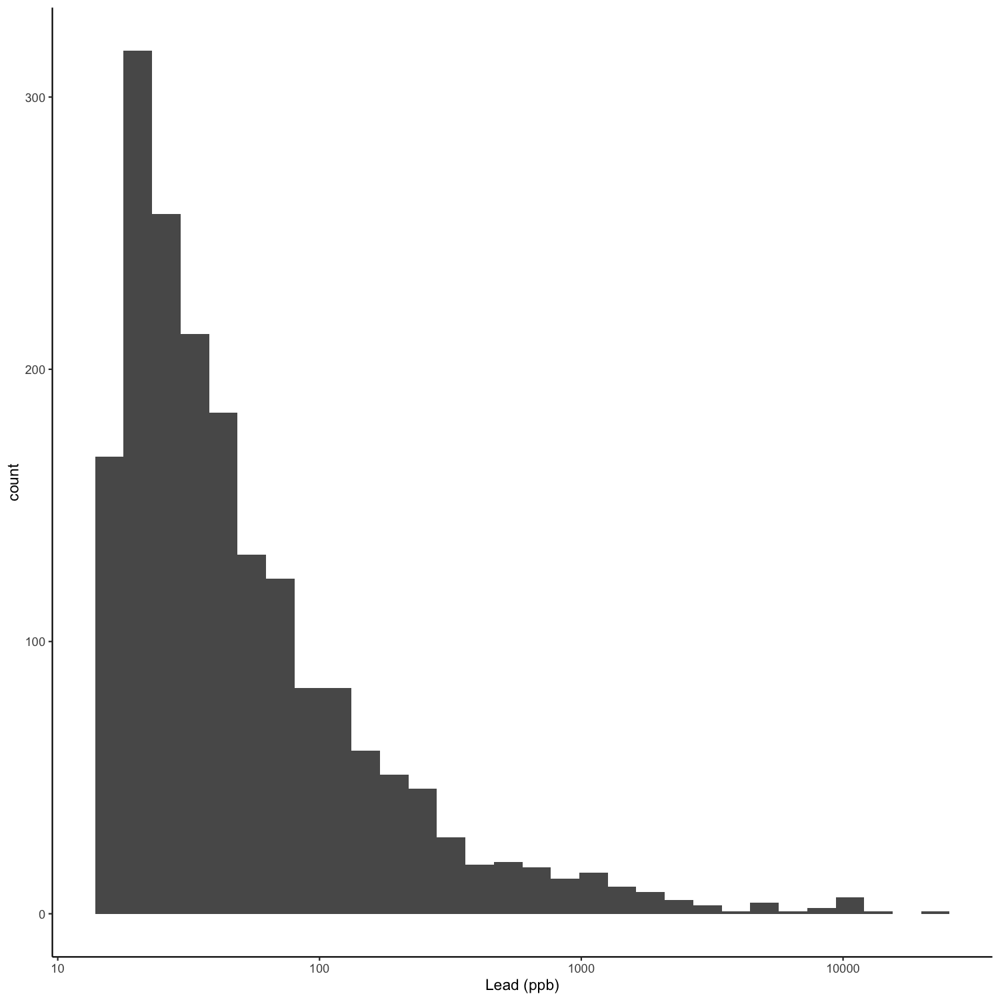

In [44]:
# what's the overall distribution of lead?

flint %>% filter(`Lead (ppb)` > 15) %>% ggplot + geom_histogram(aes(x = `Lead (ppb)`)) + scale_x_log10()

## Spatial distribution of lead exposure
- Each row has an address. 
- To map the data, we need to add spatial information by converting the address to lat/long coordinates.
- This is called *geocoding*.

In [45]:
library(tidygeocoder)

In [46]:
# form the addresses
flint <- flint %>% mutate(addr = paste(`Street #`, `Street Name`, `City`, "MI", `Zip Code`))

In [47]:
flint %>% geocode(addr, method = "census")

ERROR: Error: 15,770 unique addresses found which exceeds the batch limit of 10,000.


In [4]:
 #flints <- list(
   #  flint[1:10000,],
  #   flint[10000:20000,],
 #    flint[20000:nrow(flint),]
# )
# flint_geocode <- flints %>% map_dfr(\(df) geocode(df, addr, method = "census"))
# save(flint, flint_geocode, file="flint.RData")

In [49]:
flint_geocode %>% head

Sample Number,Date Submitted,Analysis (Lead),Lead (ppb),Analysis (Copper),Copper (ppb),Street #,Street Name,City,Zip Code,addr,lat,long
<chr>,<dttm>,<chr>,<dbl>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>
LF84899,2015-09-25 11:07:30,Lead,0,Copper,0,1930,COLCHESTER RD,FLINT,48503,1930 COLCHESTER RD FLINT MI 48503,42.99443,-83.72368
LF85330,2015-09-29 14:35:09,Lead,0,Copper,0,1505,W COURT ST/POWERS CATHOLIC SCH,FLINT,48503,1505 W COURT ST/POWERS CATHOLIC SCH FLINT MI 48503,43.00676,-83.70365
LF85604,2015-09-30 13:06:52,Lead,0,Copper,220,605,GARLAND ST /2,FLINT,48503,605 GARLAND ST /2 FLINT MI 48503,43.02062,-83.69630
LF85613,2015-09-30 13:07:02,Lead,0,Copper,0,4307,OGEMA AVE,FLINT,48507,4307 OGEMA AVE FLINT MI 48507,42.98497,-83.66088
LF85796,2015-10-01 11:10:35,Lead,0,Copper,140,2422,BASSETT PL,FLINT,48504,2422 BASSETT PL FLINT MI 48504,43.03843,-83.72347
LF85797,2015-10-01 11:10:36,Lead,0,Copper,0,3729,WOODROW AVE,FLINT,48506,3729 WOODROW AVE FLINT MI 48506,43.03786,-83.63973


- Now, we will convert the lat/long coordinates to a spatial column that we can use for mapping.
- But first we have to figure out what coordinates everything is in!
- After some Googling, I found [this](https://www2.census.gov/geo/pdfs/maps-data/data/FAQ_for_Census_Bureau_Public_Geocoder.pdf).

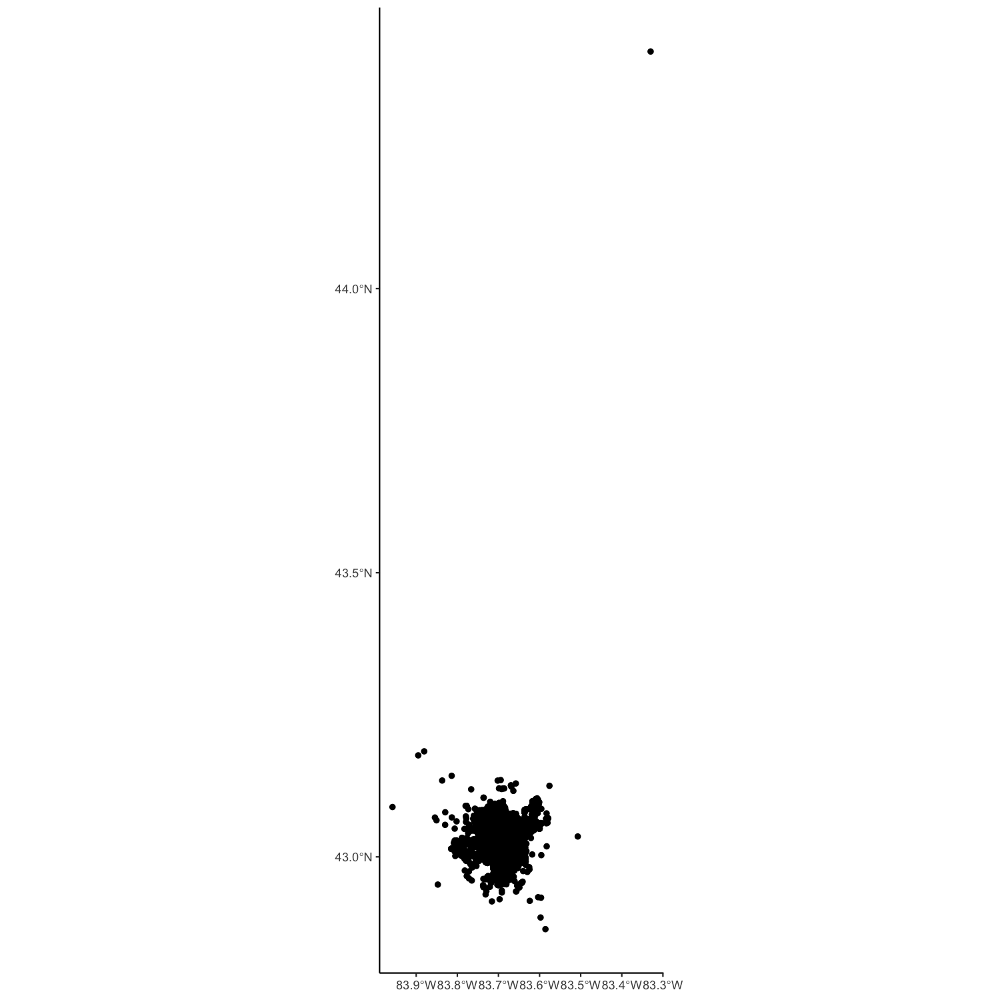

In [50]:
flint_geocode %>% 
    drop_na(long, lat) %>% 
    st_as_sf(coords = c("long", "lat"), crs = "NAD83") %>%
    ggplot + geom_sf()

In [2]:
flint_geocode_sf <- flint_geocode %>% 
    drop_na(long, lat) %>% 
    st_as_sf(coords = c("long", "lat"), crs = "NAD83") 

#flint_geocode_sf 

ERROR: Error in flint_geocode %>% drop_na(long, lat) %>% st_as_sf(coords = c("long", : could not find function "%>%"


In [3]:
library(ggspatial)

#flint_geocode_sf %>% 
 #   filter(`Lead (ppb)` > 15) %>% 
  #  mutate(log_ppb = log10(`Lead (ppb)`)) %>% 
   # ggplot() +
   # annotation_map_tile(type = "osm", zoomin = 1) + 
   # geom_sf(aes(size = log_ppb, color = log_ppb), alpha = 0.1) + 
   # xlim(c(-83.8, -83.55)) + ylim(c(42.95, 43.1)) +
   # theme_minimal()

## Choropleth
- A choropleth uses shades or colors to correspond to data ranges
- Makes visual comparison across regions easier.

![literacy in france](https://upload.wikimedia.org/wikipedia/commons/3/38/Carte_figurative_de_l%27instruction_populaire_de_la_France.jpg)

- For boundaries on our map, we'll use Census tracts, because we have good socioeconomic data 
- To make this easy, we'll use the excellent [`tidycensus`](https://walker-data.com/tidycensus/articles/spatial-data.html) package.

In [1]:
library(tidycensus)
options(tigris_use_cache = TRUE)

genesee <- get_acs(
  state = "MI",
  county = "Genesee",
  geography = "tract",
  variables = "B19013_001",
  geometry = TRUE,
  year = 2020
)

#genesee

Getting data from the 2016-2020 5-year ACS

Warning message:
“• You have not set a Census API key. Users without a key are limited to 500
queries per day and may experience performance limitations.
ℹ For best results, get a Census API key at
http://api.census.gov/data/key_signup.html and then supply the key to the
`census_api_key()` function to use it throughout your tidycensus session.
This warning is displayed once per session.”


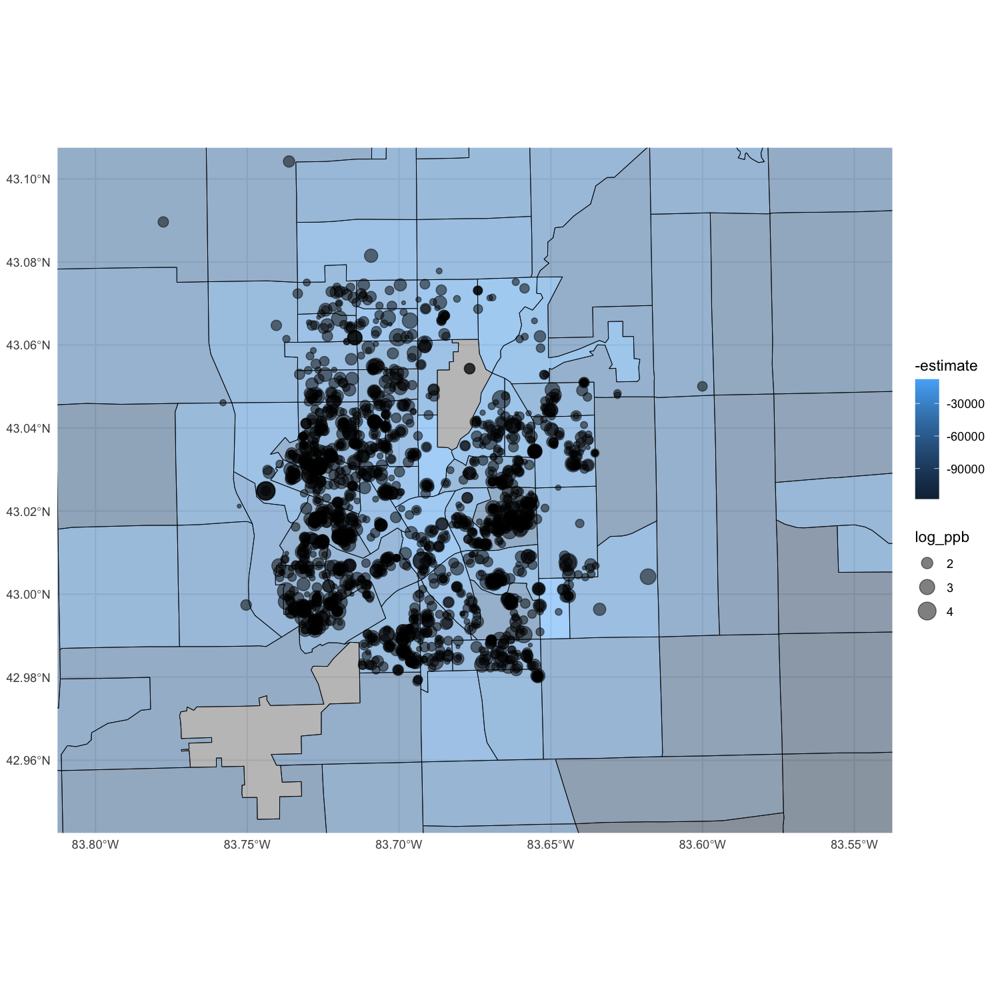

In [54]:
flint_geocode_sf %>% 
    filter(`Lead (ppb)` > 15) %>% 
    mutate(log_ppb = log10(`Lead (ppb)`)) %>% 
    ggplot() +
    geom_sf(data=genesee, aes(fill = -estimate), color = "black", alpha=0.5) +
    geom_sf(aes(size = log_ppb), alpha = 0.5) + 
    xlim(c(-83.8, -83.55)) + ylim(c(42.95, 43.1)) +
    theme_minimal()